In [ ]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# Data Pre-processing

In [1]:
# Environment setups
import os, sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

# Utils functions
from utils.dataset import load
from utils.preprocess import find_duplicates, visualize_duplicates, copy_dataset_from_df, augment_duplicated_images_loop
from utils.plotting import create_countplot, create_k_samples

# Importing libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define Variables
rawDataPath = "../Data/Furniture_Data/"
augmentedDataPath = "../Data/Processed_Data/"

c:\Users\Hoang\anaconda3\Lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: '[WinError 127] The specified procedure could not be found'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


## 1. Loading the raw data

In [2]:
# Load the data
rawData = load(rawDataPath)

Error processing ../Data/Furniture_Data/lamps\Modern\11286modern-lighting.jpg: [Errno 13] Permission denied: '../Data/Furniture_Data/lamps\\Modern\\11286modern-lighting.jpg'


In [3]:
rawData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90083 entries, 0 to 90082
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   ImgPath         90083 non-null  object 
 1   FileType        90083 non-null  object 
 2   Width           90083 non-null  int64  
 3   Height          90083 non-null  int64  
 4   Ratio           90083 non-null  float64
 5   Mode            90083 non-null  object 
 6   Bands           90083 non-null  object 
 7   Transparency    90083 non-null  bool   
 8   Animated        90083 non-null  bool   
 9   Category        90083 non-null  object 
 10  Interior_Style  90083 non-null  object 
dtypes: bool(2), float64(1), int64(2), object(6)
memory usage: 6.4+ MB


## 2. Data Cleaning

## 2.1 Find and handle duplicates

In [4]:
# Copy the dataset from the dataframe
copy_dataset_from_df(rawData, rawDataPath, augmentedDataPath)

Copied ../Data/Furniture_Data/beds/Asian/19726asian-daybeds.jpg to ../Data/Processed_Data/beds/Asian/19726asian-daybeds.jpg
Copied ../Data/Furniture_Data/beds/Asian/20027asian-canopy-beds.jpg to ../Data/Processed_Data/beds/Asian/20027asian-canopy-beds.jpg
Copied ../Data/Furniture_Data/beds/Asian/20109asian-panel-beds.jpg to ../Data/Processed_Data/beds/Asian/20109asian-panel-beds.jpg
Copied ../Data/Furniture_Data/beds/Asian/20508asian-platform-beds.jpg to ../Data/Processed_Data/beds/Asian/20508asian-platform-beds.jpg
Copied ../Data/Furniture_Data/beds/Asian/20750asian-comforters-and-comforter-sets.jpg to ../Data/Processed_Data/beds/Asian/20750asian-comforters-and-comforter-sets.jpg
Copied ../Data/Furniture_Data/beds/Asian/20802asian-platform-beds.jpg to ../Data/Processed_Data/beds/Asian/20802asian-platform-beds.jpg
Copied ../Data/Furniture_Data/beds/Asian/2537asian-platform-beds.jpg to ../Data/Processed_Data/beds/Asian/2537asian-platform-beds.jpg
Copied ../Data/Furniture_Data/beds/Asian

In [5]:
# Augment duplicated images
augment_duplicated_images_loop(rawData, augmentedDataPath, 2)

Augmented image saved to ../Data/Processed_Data/beds/Asian/19726asian-daybeds.jpg
Augmented image saved to ../Data/Processed_Data/beds/Asian/7634asian-daybeds.jpg
Augmented image saved to ../Data/Processed_Data/beds/Asian/20508asian-platform-beds.jpg
Augmented image saved to ../Data/Processed_Data/beds/Asian/3413asian-platform-beds.jpg
Augmented image saved to ../Data/Processed_Data/beds/Asian/20750asian-comforters-and-comforter-sets.jpg
Augmented image saved to ../Data/Processed_Data/beds/Asian/3112asian-daybeds.jpg
Augmented image saved to ../Data/Processed_Data/beds/Asian/20802asian-platform-beds.jpg
Augmented image saved to ../Data/Processed_Data/beds/Asian/2709asian-platform-beds.jpg
Augmented image saved to ../Data/Processed_Data/beds/Asian/2879asian-daybeds.jpg
Augmented image saved to ../Data/Processed_Data/beds/Contemporary/151contemporary-daybeds.jpg
Augmented image saved to ../Data/Processed_Data/beds/Transitional/4930transitional-daybeds.jpg
Augmented image saved to ../Data

Checking for duplicates after augmentation

In [6]:
# Check for duplicates in the augmented data
augmented_duplicates = find_duplicates(rawData, augmentedDataPath)

In [7]:
augmented_duplicates.describe()

,Hash,ImgPath
count,381,381
unique,184,381
top,ea94c63d94e03d2b,beds/Contemporary/2241contemporary-kids-beds.jpg
freq,4,1


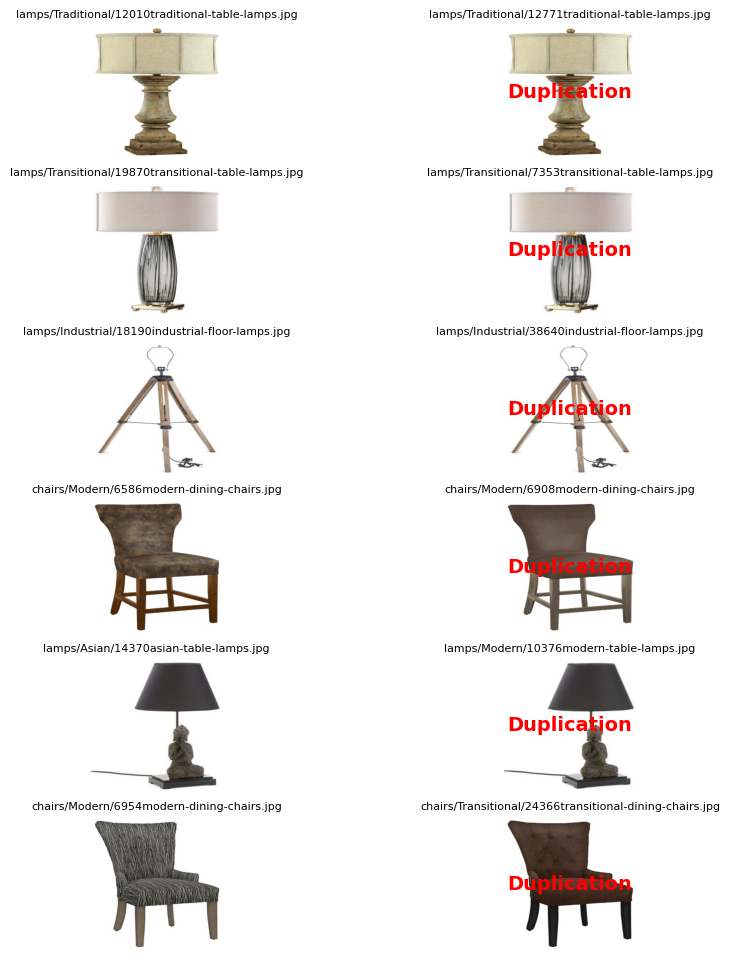

In [8]:
# Visualize duplicates to check if they are actually duplicates
visualize_duplicates(augmented_duplicates, 6)